<a href="https://colab.research.google.com/github/HimasagarU/AttentionEEG/blob/main/First_Analysis/analysis2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install and import Libraries, Datasets and clone git repo


In [14]:
#@title Run this cell and the cells below. This might take a few minutes.
%%capture
%pip install scipy
%pip install seaborn
%pip install mne
%pip install python-picard
import mne
import numpy as np

# System Imports
import os
from glob import glob
from collections import OrderedDict
import warnings
warnings.filterwarnings('ignore')

# Common Imports
import pandas as pd
import numpy as np

# MNE: EEG Analysis Library
from mne import Epochs,find_events

# Specific MNE Imports
from mne import create_info, concatenate_raws
from mne.io import RawArray
from mne.channels import make_standard_montage
from mne.preprocessing import ICA

# Install some necessary packages
%pip install psychopy brainflow
!apt install xvfb -y
%pip install pyvirtualdisplay
%pip install piglet
%pip install mne pywavelets matplotlib
import pywt

# Set up virtual display
# (Source: https://colab.research.google.com/drive/1tug_bpg8RwrFOI8C6Ed-zo0OgD3yfnWy)
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()
import os
if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0:
    !bash ../xvfb start
    %env DISPLAY=:1

!pip install pyriemann
# from sklearn.pipeline import make_pipeline

# from mne.decoding import Vectorizer

# from sklearn.linear_model import LogisticRegression
# from sklearn.preprocessing import StandardScaler
# from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit

# from pyriemann.estimation import ERPCovariances, XdawnCovariances
# from pyriemann.tangentspace import TangentSpace
# from pyriemann.classification import MDM

from collections import OrderedDict


import seaborn as sns
from matplotlib import pyplot as plt

%matplotlib inline

In [2]:
%cd /content
!git clone https://github.com/HimasagarU/AttentionEEG.git
%cd AttentionEEG

/content
Cloning into 'AttentionEEG'...
remote: Enumerating objects: 89, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 89 (delta 30), reused 29 (delta 12), pack-reused 0 (from 0)
Receiving objects: 100% (89/89), 10.66 MiB | 11.59 MiB/s, done.
Resolving deltas: 100% (30/30), done.
/content/AttentionEEG


In [3]:
#@title Import dataset folder from gdrive
%pip install --upgrade gdown

import gdown

# Replace with the ID of your shared Google Drive folder
folder_id = '133jyRxBuRK0g9YjEED2Vj5qowAdfTNhg'

# List all files in the folder
!gdown --folder {folder_id} --fuzzy

Retrieving folder contents
Processing file 1IpgG1E5o0JBpCnaYwGyG6T7rV6w1S6Xn First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv
Processing file 1Rsbezo1RjtH8cGw7fcFbtf52fjRO2FQc First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.json
Processing file 15PV9VvtQNBtA16iB7qlqFlwTLweAxyRv First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.mc.pm.fe.bp.csv
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1IpgG1E5o0JBpCnaYwGyG6T7rV6w1S6Xn
To: /content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv
100% 3.08k/3.08k [00:00<00:00, 12.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Rsbezo1RjtH8cGw7fcFbtf52fjRO2FQc
To: /content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.json
100% 29.1k/29.1k [00:00<00:00, 89.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=15PV9Vv

# Step 1: Loading and Readying the Data to create raw data


In [4]:
#@title Load the marker CSV file
marker_df = pd.read_csv('/content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30_intervalMarker.csv')
marker_df.head(3)

,latency,duration,type,marker_value,key,timestamp,marker_id
0,3.720729,19.992604,Eyes_Opened,1,-1,1.727084e+09,1
1,28.878264,20.001177,Eyes_Closed,3,-1,1.727084e+09,2
2,58.112798,0.000000,lab_start,10,10,1.727084e+09,3


In [5]:
#@title Load the EEG data
eeg_data = pd.read_csv('/content/AttentionEEG/Trial1_text_data/First_Trail_EPOCX_237738_2024.09.23T15.01.39+05.30.mc.pm.fe.bp.csv',skiprows=1,header=0)
print(eeg_data['MarkerValueInt'].value_counts())
eeg_data_df = eeg_data[['Timestamp', 'MarkerValueInt', 'EEG.Counter', 'EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5',
                        'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4',
                        'EEG.F8', 'EEG.AF4']]
eeg_data_df = eeg_data_df.rename(columns={'Timestamp': 'timestamp'})
eeg_data_df.head(4)

MarkerValueInt
110.0    19
109.0    19
32.0      4
10.0      2
3.0       2
1.0       2
31.0      2
Name: count, dtype: int64


,timestamp,MarkerValueInt,EEG.Counter,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,EEG.O2,EEG.P8,EEG.T8,EEG.FC6,EEG.F4,EEG.F8,EEG.AF4
0,1.727084e+09,NaN,27.0,4331.922852,4295.512695,4340.000000,4332.948730,4293.205078,4286.538574,4295.641113,4293.589844,4279.358887,4270.384766,4498.333496,4497.692383,4426.410156,4494.487305
1,1.727084e+09,NaN,28.0,4335.000000,4298.333496,4341.666504,4335.641113,4292.179688,4289.615234,4296.153809,4295.512695,4281.410156,4276.282227,4505.897461,4503.333496,4435.641113,4500.384766
2,1.727084e+09,NaN,29.0,4337.563965,4303.077148,4342.948730,4339.487305,4292.820313,4291.025879,4296.666504,4298.461426,4283.077148,4281.153809,4514.487305,4509.358887,4443.846191,4506.922852
3,1.727084e+09,NaN,30.0,4339.743652,4307.051270,4344.102539,4342.179688,4293.846191,4288.077148,4296.666504,4301.666504,4284.487305,4283.974121,4521.666504,4513.333496,4447.948730,4512.051270


In [6]:
#@title Filling MarkerValueInt column in dataframe with previous Value
eeg_data_df['MarkerValueInt'] = eeg_data_df['MarkerValueInt'].ffill()
eeg_data_df['MarkerValueInt'].value_counts()

,count
MarkerValueInt,
32.0,65634
110.0,20599
109.0,18770
31.0,16593
3.0,7488
1.0,6444
10.0,3040


In [7]:
#@title The marker value and corresponding type
print(marker_df[['marker_value','type']].value_counts())

marker_value  type           
110           Thinking_answer    19
109           reading_ques       19
32            eyes_open           4
10            lab_start           2
31            eye_close           2
3             Eyes_Closed         1
1             Eyes_Opened         1
Name: count, dtype: int64


We are concerned only with marker values 32, 109, 110 which are respectively eyes_open(reading_text_data), reading_ques, Thinking_answer

In [8]:
#@title Grouping data based on marker value
grouped_eeg_data = eeg_data_df.groupby('MarkerValueInt')

In [9]:
#@title ReadingText data
reading_text_data = grouped_eeg_data.get_group(32)
print(reading_text_data.shape)
reading_text_data.info()

(65634, 17)
<class 'pandas.core.frame.DataFrame'>
Index: 65634 entries, 17925 to 83558
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   timestamp       65634 non-null  float64
 1   MarkerValueInt  65634 non-null  float64
 2   EEG.Counter     65634 non-null  float64
 3   EEG.AF3         65634 non-null  float64
 4   EEG.F7          65634 non-null  float64
 5   EEG.F3          65634 non-null  float64
 6   EEG.FC5         65634 non-null  float64
 7   EEG.T7          65634 non-null  float64
 8   EEG.P7          65634 non-null  float64
 9   EEG.O1          65634 non-null  float64
 10  EEG.O2          65634 non-null  float64
 11  EEG.P8          65634 non-null  float64
 12  EEG.T8          65634 non-null  float64
 13  EEG.FC6         65634 non-null  float64
 14  EEG.F4          65634 non-null  float64
 15  EEG.F8          65634 non-null  float64
 16  EEG.AF4         65634 non-null  float64
dtypes: float64(17)
memor

## Creating info and Raw data

In [10]:
sampling_rate = 256
ch_names = ['EEG.AF3','EEG.F7','EEG.F3','EEG.FC5','EEG.T7','EEG.P7','EEG.O1','EEG.O2','EEG.P8','EEG.T8','EEG.FC6','EEG.F4','EEG.F8','EEG.AF4']
clean_ch_names = [ch.replace('EEG.', '') for ch in ch_names]
clean_ch_names

['AF3',
 'F7',
 'F3',
 'FC5',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'FC6',
 'F4',
 'F8',
 'AF4']

In [11]:
n_channels = len(clean_ch_names)
print(n_channels)
reading_text_data2 = reading_text_data.iloc[:,3:17].to_numpy().T
reading_text_data2.shape

14


(14, 65634)

In [12]:
info = mne.create_info(clean_ch_names, sfreq=sampling_rate, ch_types=['eeg']*n_channels)
raw = mne.io.RawArray(reading_text_data2, info)
raw.set_eeg_reference('average', projection=True)
print(reading_text_data2.shape)  # Should be (n_channels, n_times)
print(len(ch_names))
print(raw.info)

Creating RawArray with float64 data, n_channels=14, n_times=65634
    Range : 0 ... 65633 =      0.000 ...   256.379 secs
Ready.
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
(14, 65634)
14
<Info | 8 non-empty values
 bads: []
 ch_names: AF3, F7, F3, FC5, T7, P7, O1, O2, P8, T8, FC6, F4, F8, AF4
 chs: 14 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: unspecified
 nchan: 14
 projs: Average EEG reference: off
 sfreq: 256.0 Hz
>


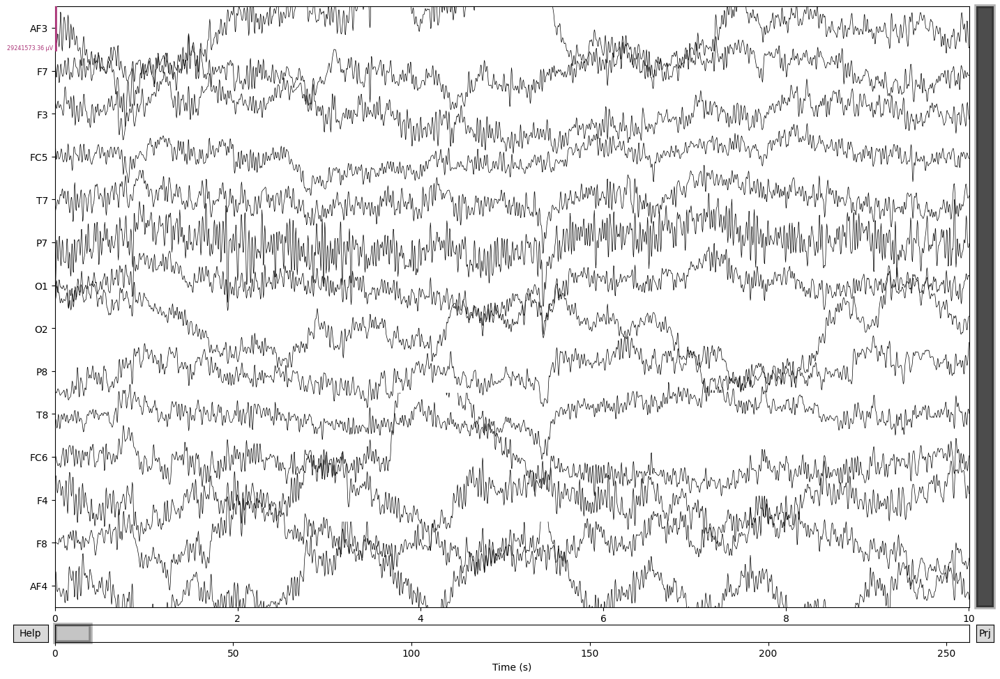

In [35]:
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, match_case=False)
fig = raw.plot(scalings = 'auto', show=False)
fig.set_size_inches(15, 10)
plt.show()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


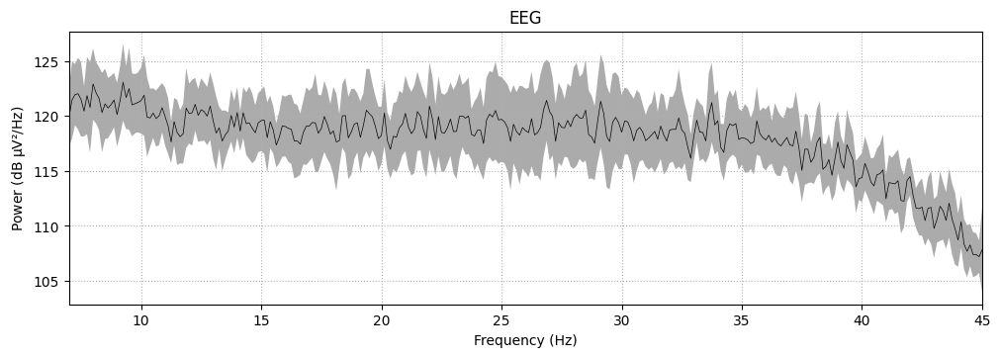

In [36]:
raw.plot_psd(tmin=0, tmax=60, fmin=7, fmax=45, average=True, spatial_colors=False);

In [37]:
raw_filtered = raw.copy().filter(l_freq=7, h_freq=45)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 7 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 423 samples (1.652 s)



In [38]:
montage = mne.channels.make_standard_montage('standard_1020')
raw_filtered.set_montage(montage, match_case=False)

<RawArray | 14 x 65634 (256.4 s), ~7.0 MB, data loaded>

Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


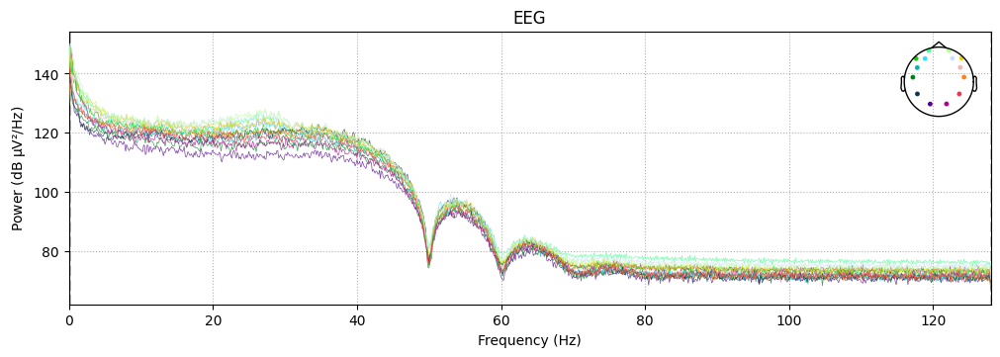

In [40]:
raw.compute_psd().plot();

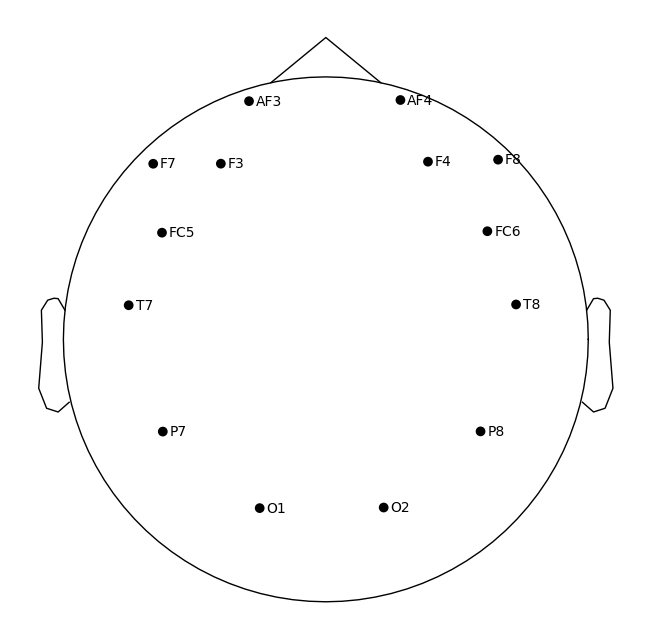

In [39]:
raw_filtered.plot_sensors(show_names=True);

Effective window size : 8.000 (s)
Plotting power spectral density (dB=True).


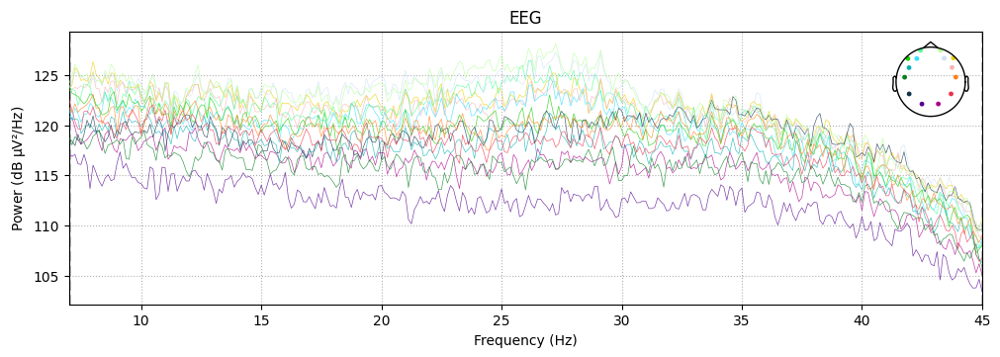

In [41]:
raw_filtered.compute_psd(fmin=7, fmax=45).plot();

In [44]:
num_components = 14
ica = ICA(n_components=num_components, method='picard')
ica.fit(raw_filtered)

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by number: 14 components
Fitting ICA took 13.1s.


Method,picard
Fit parameters,max_iter=500
Fit,67 iterations on raw data (65634 samples)
ICA components,14
Available PCA components,14
Channel types,eeg
ICA components marked for exclusion,—


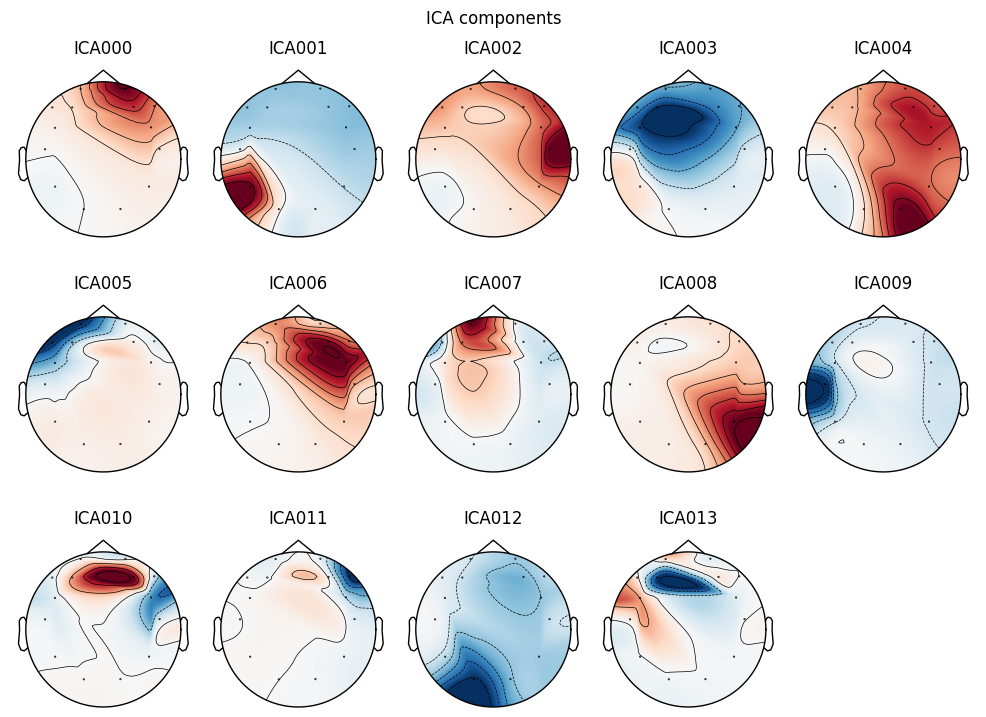

In [45]:
ica.plot_components();

Creating RawArray with float64 data, n_channels=14, n_times=65634
    Range : 0 ... 65633 =      0.000 ...   256.379 secs
Ready.


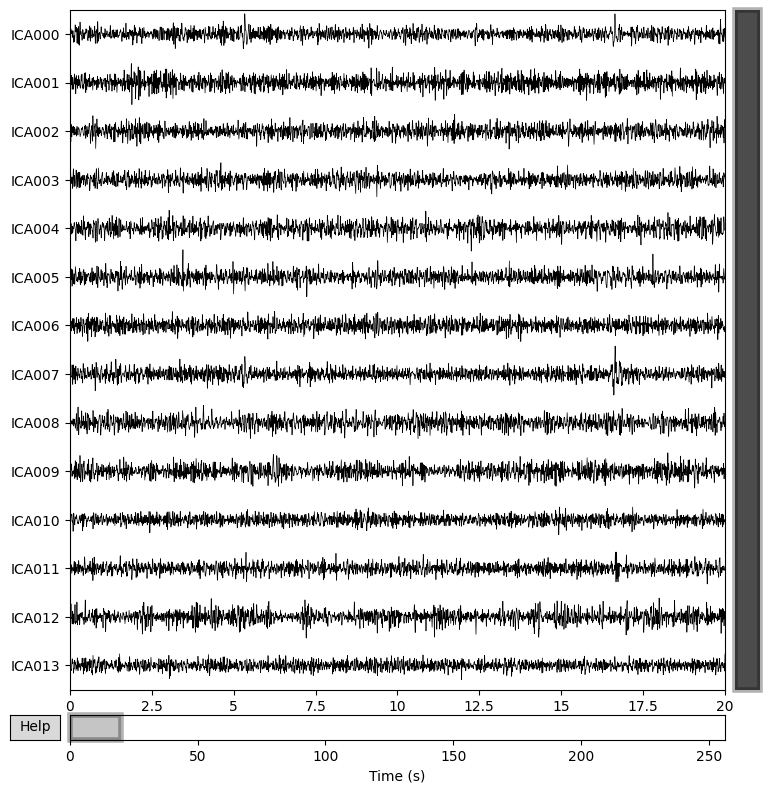

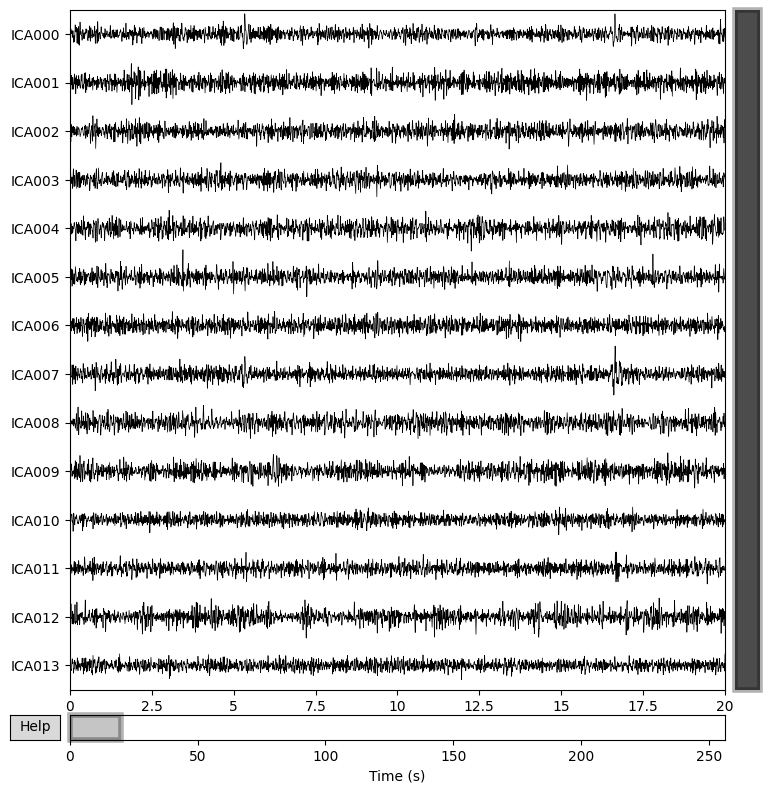

In [46]:
ica.plot_sources(raw_filtered)

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
128 matching events found
No baseline correction applied
0 pro

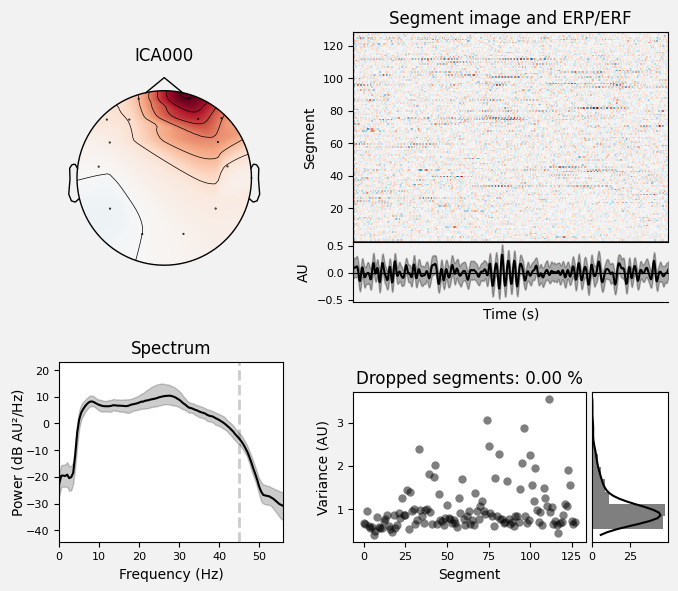

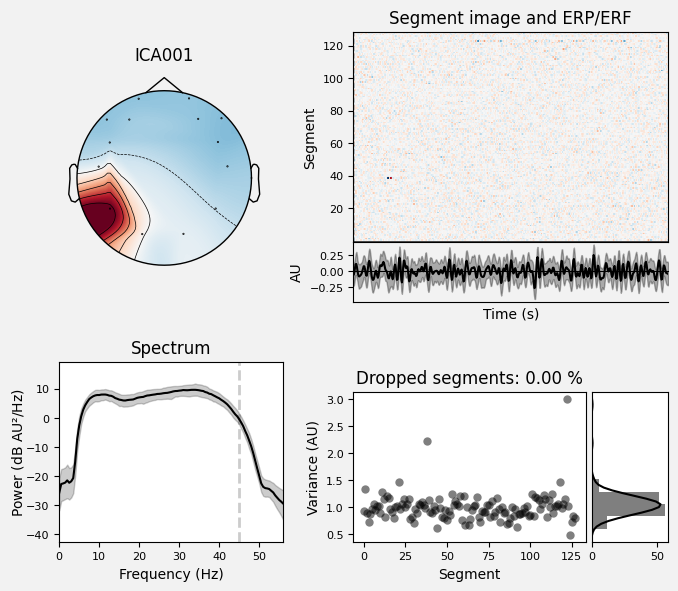

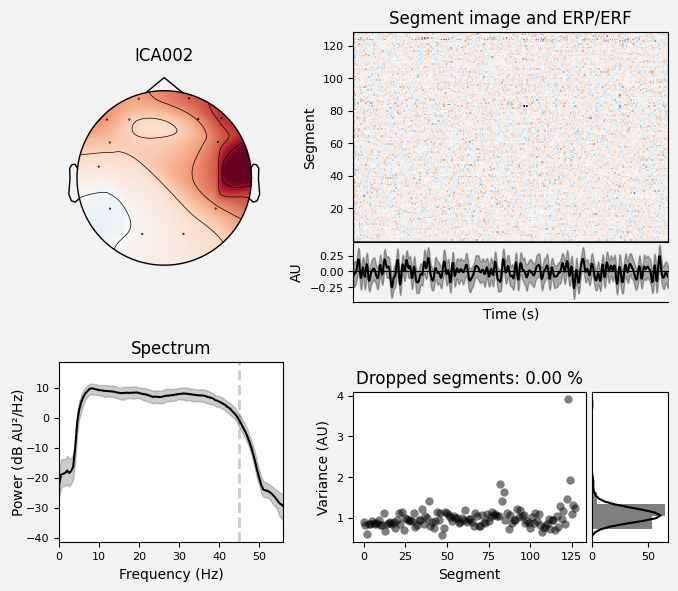

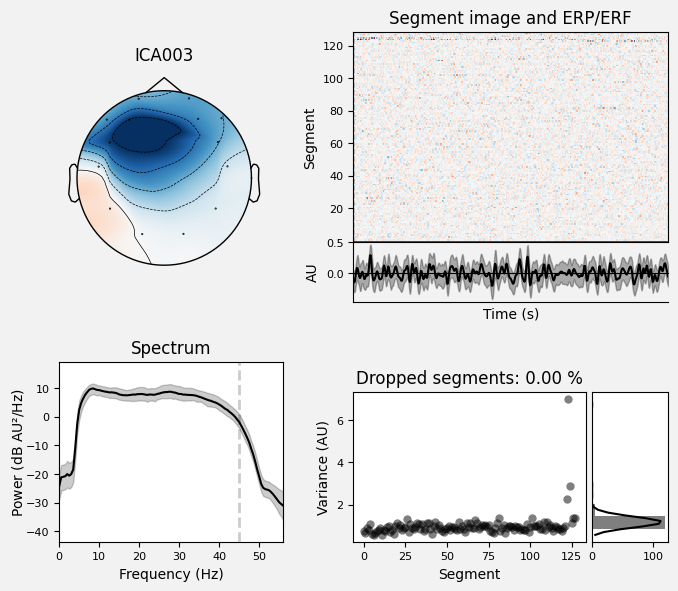

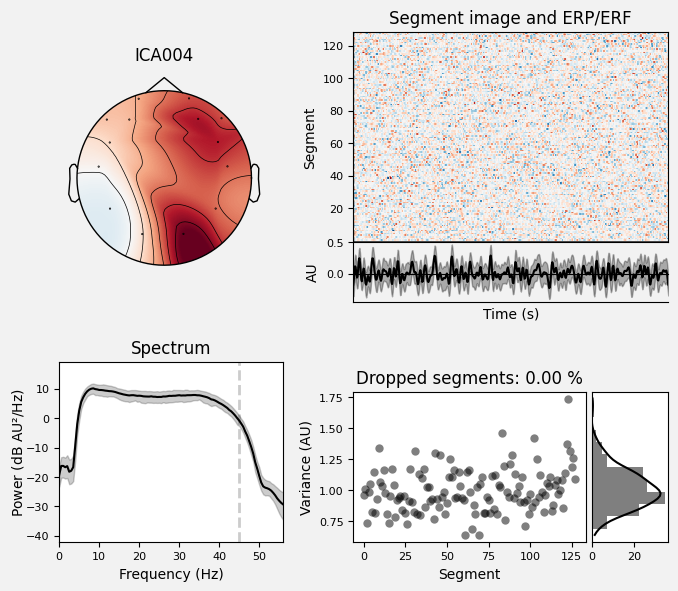

...

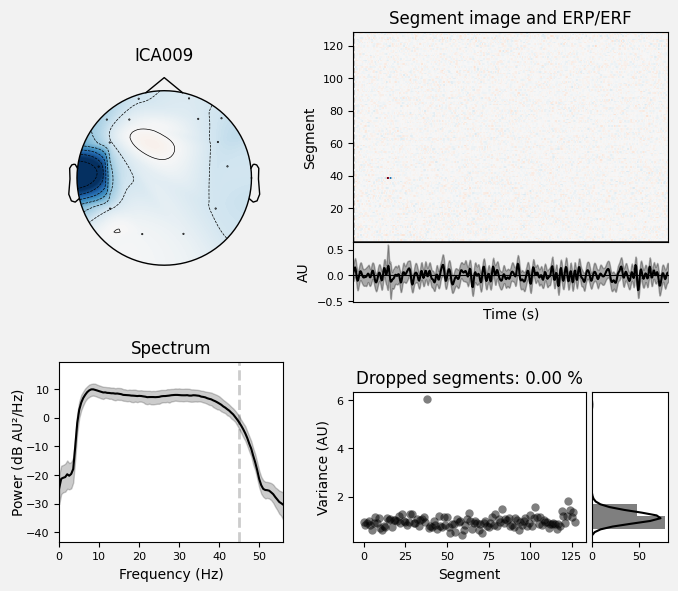

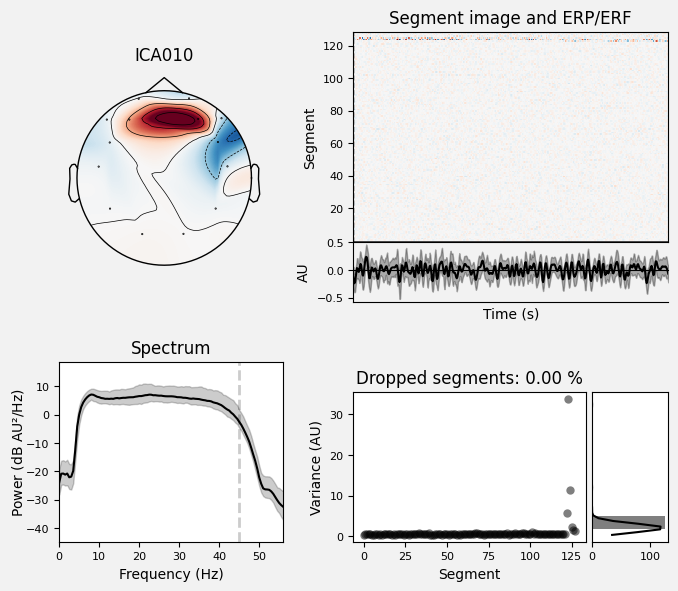

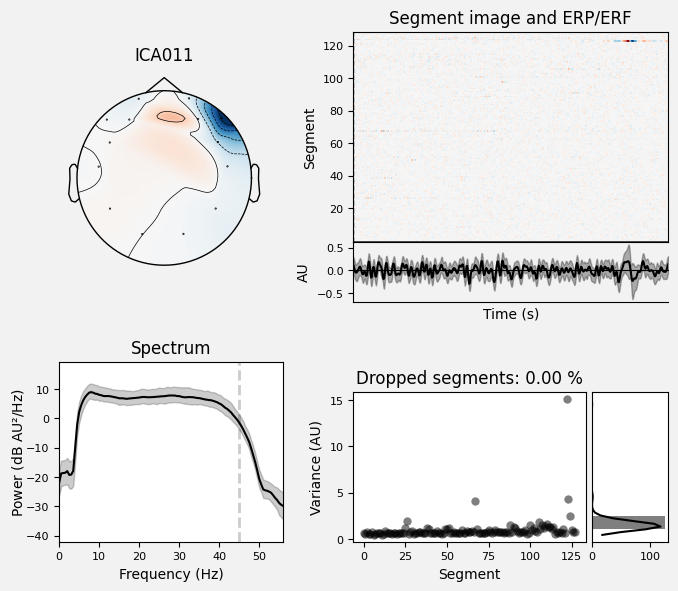

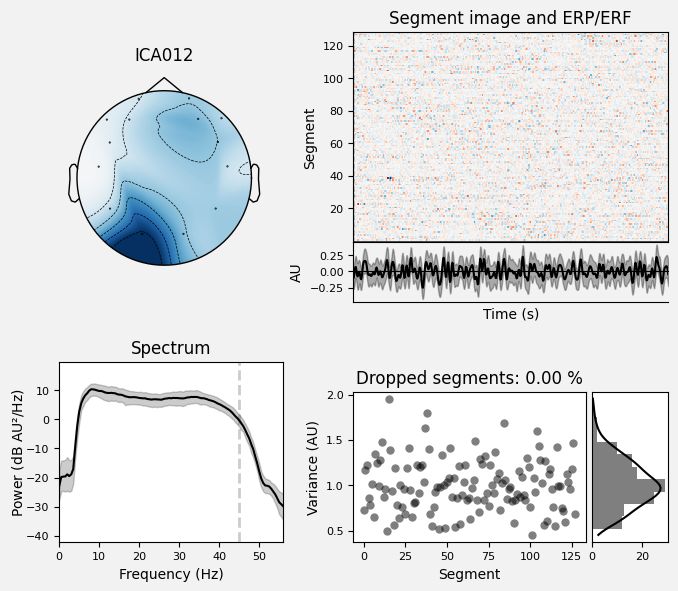

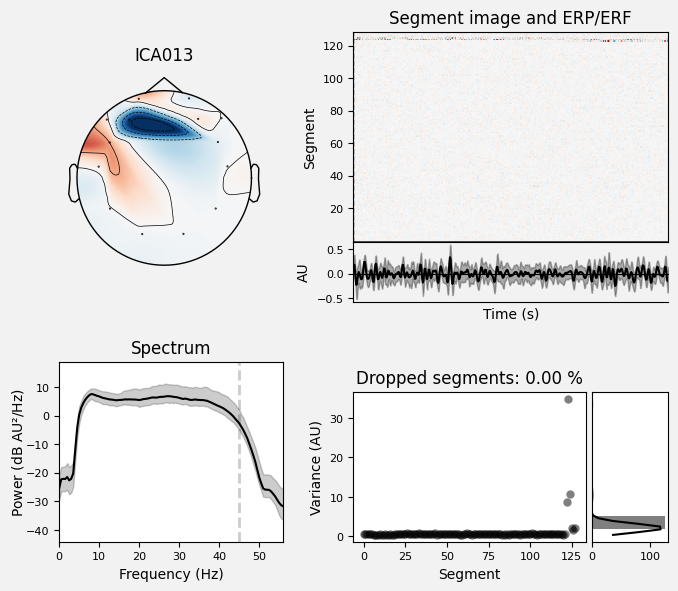

In [47]:
ica.plot_properties(raw_filtered, picks=range(num_components));

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 1 ICA component
    Projecting back using 14 PCA components


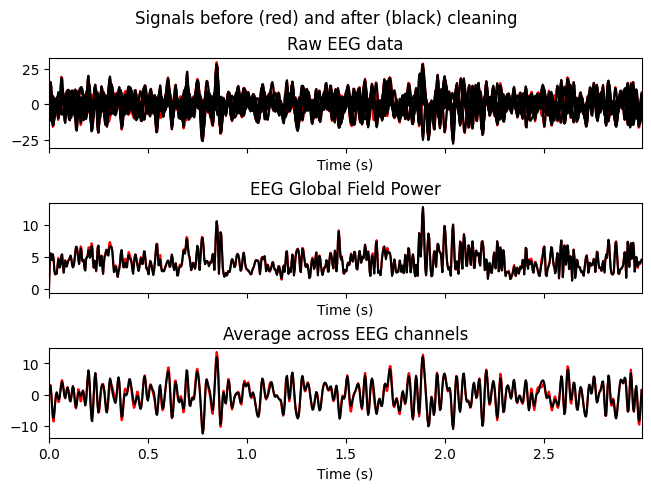

In [48]:
ica.plot_overlay(raw_filtered, exclude=[9]);

# Frequency Domain Analysis

In [49]:
data, sfreq = raw_filtered.get_data(return_times=False), raw.info['sfreq']
ch_names = raw_filtered.info['ch_names']

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
from scipy.interpolate import interp1d

# Function to smooth the power spectrum plot by interpolating
def smooth_plot(freqs, power, title):
    plt.figure(figsize=(10, 6))

    # Interpolating for a smoother curve
    f_interp = interp1d(freqs, power, kind='cubic', fill_value="extrapolate")

    # Generate more frequency points for smoothness
    freqs_smooth = np.linspace(min(freqs), max(freqs), num=500)
    power_smooth = f_interp(freqs_smooth)

    plt.plot(freqs_smooth, power_smooth)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.show()

# 1. Fourier Transform (FT)
def fourier_transform(data, sfreq, ch):
    freqs = np.fft.fftfreq(len(data[ch]), 1/sfreq)
    ft = np.fft.fft(data[ch])
    power = np.abs(ft) ** 2
    smooth_plot(freqs, power, f"Fourier Transform - {ch_names[ch]}")

# 2. Fast Fourier Transform (FFT)
def fast_fourier_transform(data, sfreq, ch):
    freqs = np.fft.rfftfreq(len(data[ch]), 1/sfreq)
    fft = np.fft.rfft(data[ch])
    power = np.abs(fft) ** 2
    smooth_plot(freqs, power, f"Fast Fourier Transform (FFT) - {ch_names[ch]}")

# 3. Discrete Wavelet Transform (DWT)
def discrete_wavelet_transform(data, ch, wavelet='db4'):
    coeffs = pywt.wavedec(data[ch], wavelet)
    plt.figure(figsize=(10, 6))
    plt.title(f"Discrete Wavelet Transform (DWT) - {ch_names[ch]}")
    for i, coeff in enumerate(coeffs):
        plt.subplot(len(coeffs), 1, i + 1)
        plt.plot(coeff)
        plt.title(f"Detail Coefficients - Level {i + 1}")
    plt.tight_layout()
    plt.show()

# 4. Continuous Wavelet Transform (CWT)
def continuous_wavelet_transform(data, sfreq, ch, wavelet='cmor'):
    scales = np.arange(1, 128)
    coef, freqs = pywt.cwt(data[ch], scales, wavelet, sampling_period=1/sfreq)
    plt.figure(figsize=(10, 6))
    plt.imshow(np.abs(coef), extent=[0, len(data[ch])/sfreq, freqs.min(), freqs.max()],
               aspect='auto', cmap='jet')
    plt.title(f"Continuous Wavelet Transform (CWT) - {ch_names[ch]}")
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.colorbar()
    plt.show()


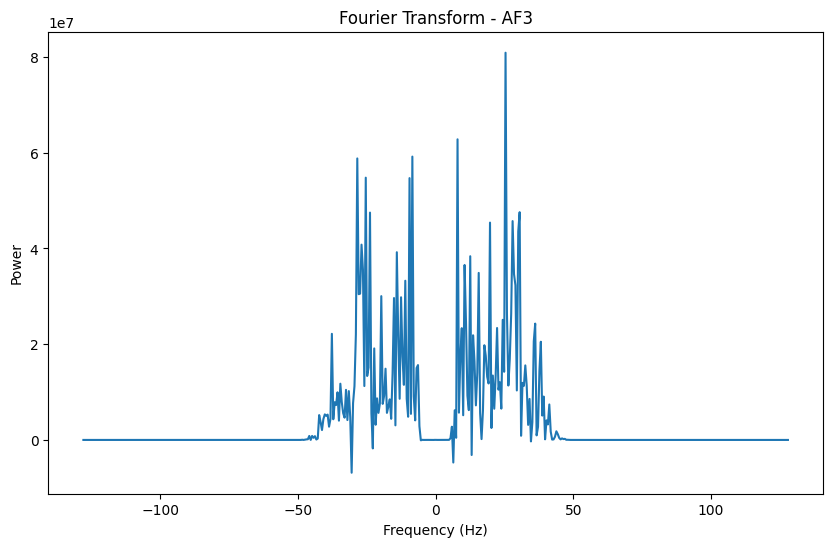

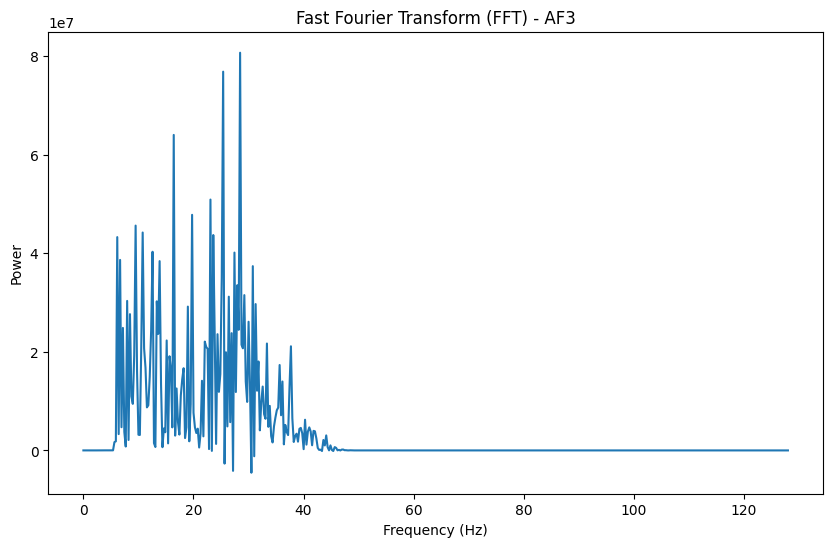

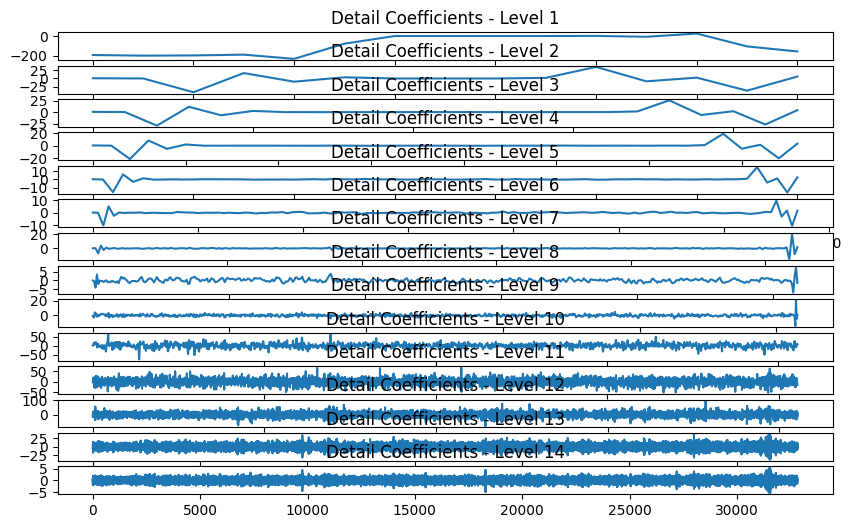

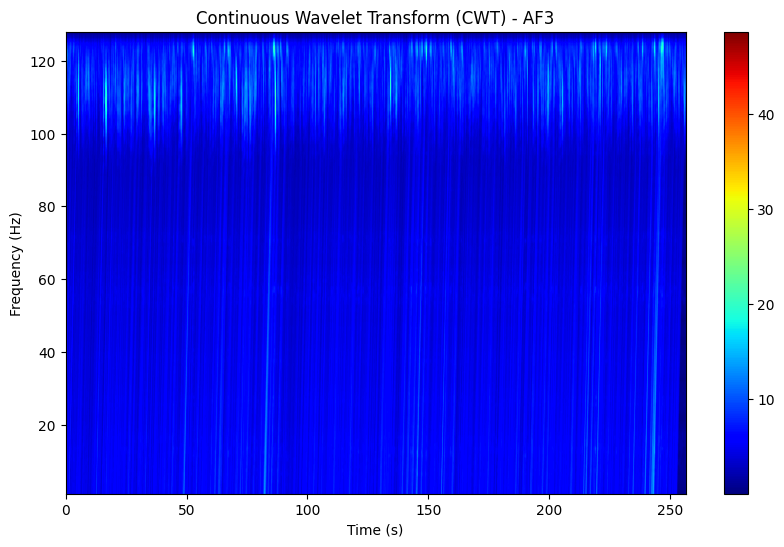

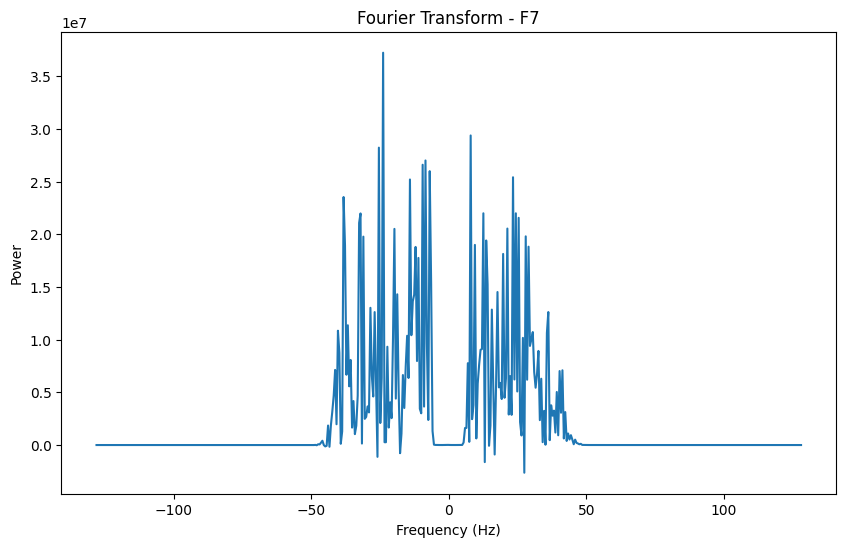

...

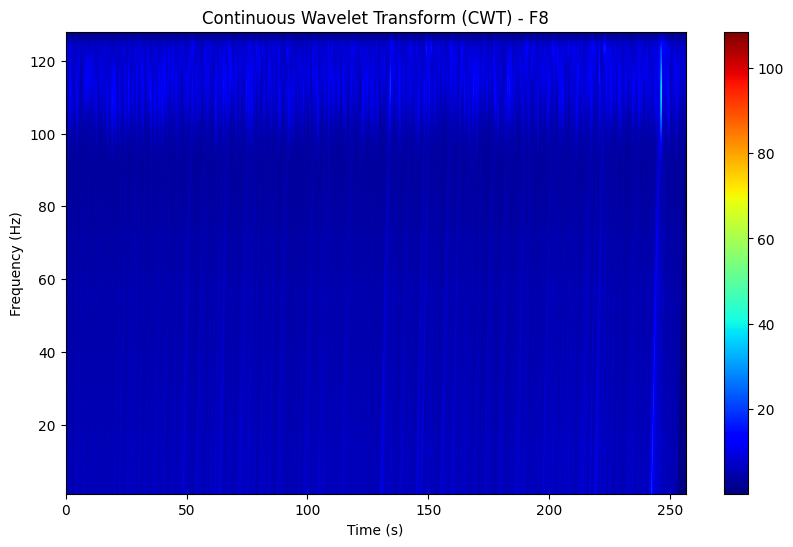

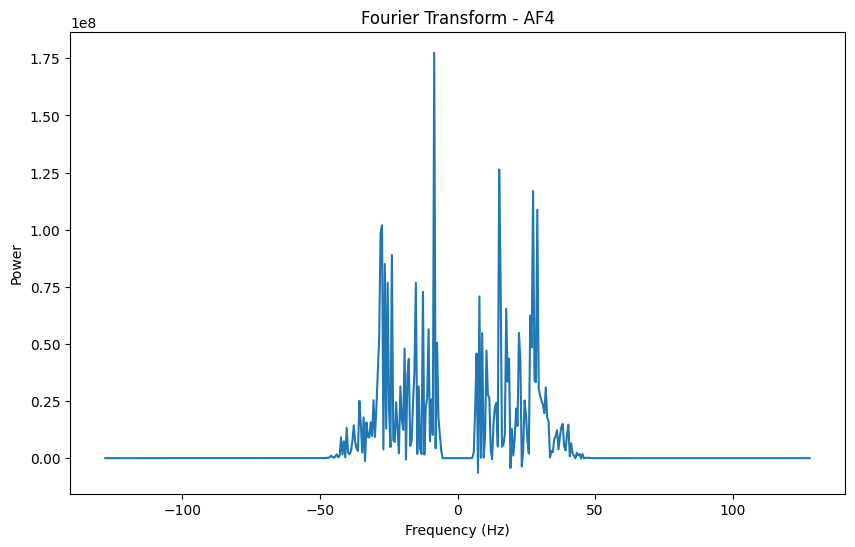

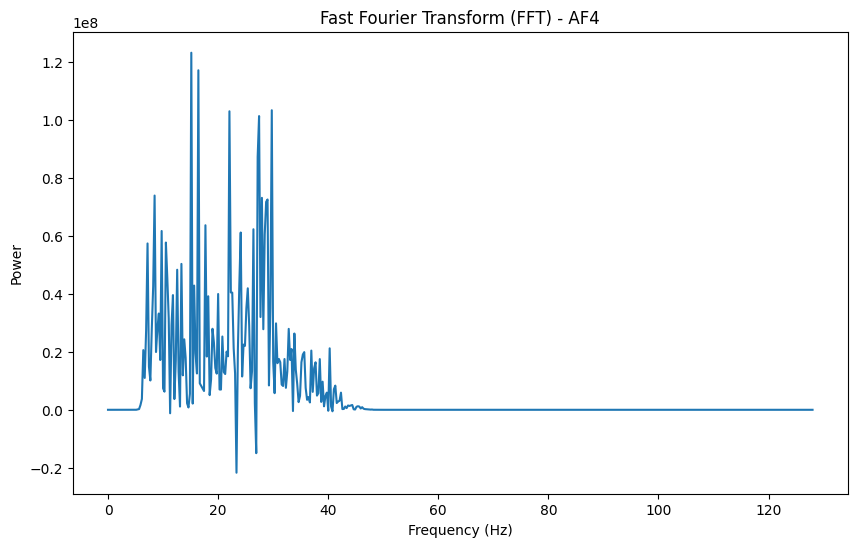

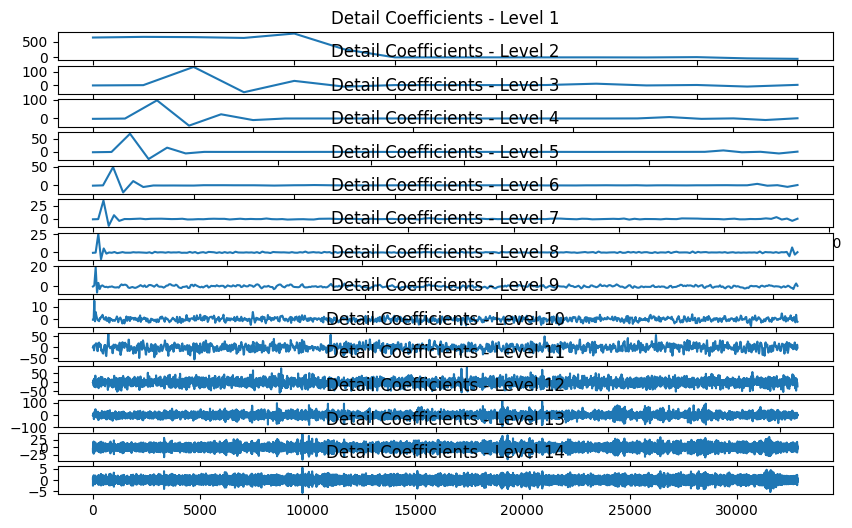

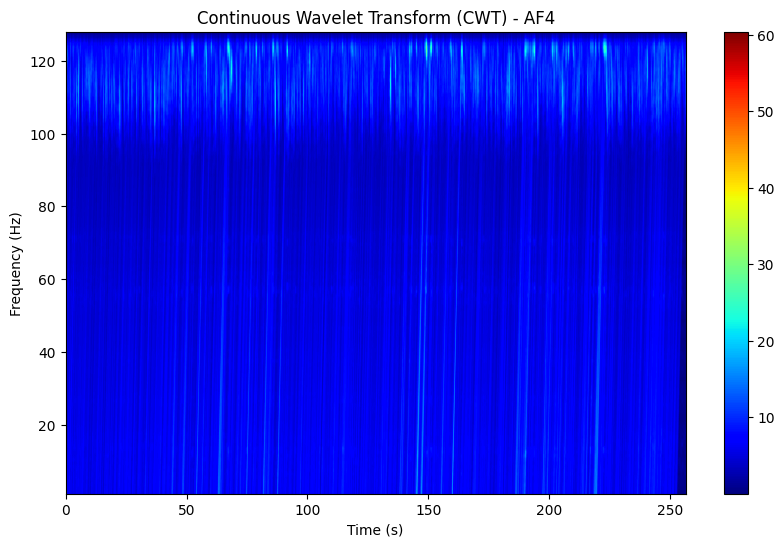

In [74]:
for ch in range(14):  # Loop over the 14 channels
    # Fourier Transform
    fourier_transform(data, sfreq, ch)

    # Fast Fourier Transform (FFT)
    fast_fourier_transform(data, sfreq, ch)

    # Discrete Wavelet Transform (DWT)
    discrete_wavelet_transform(data, ch)

    # Continuous Wavelet Transform (CWT)
    continuous_wavelet_transform(data, sfreq, ch)

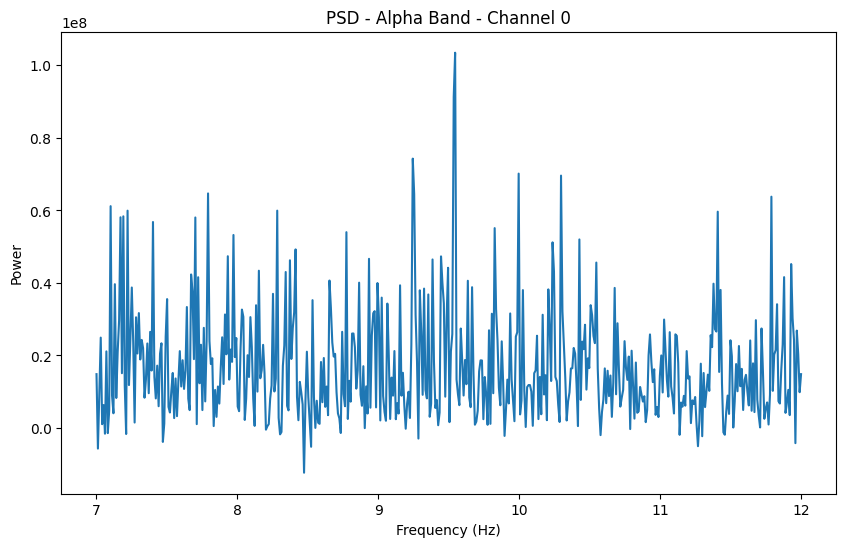

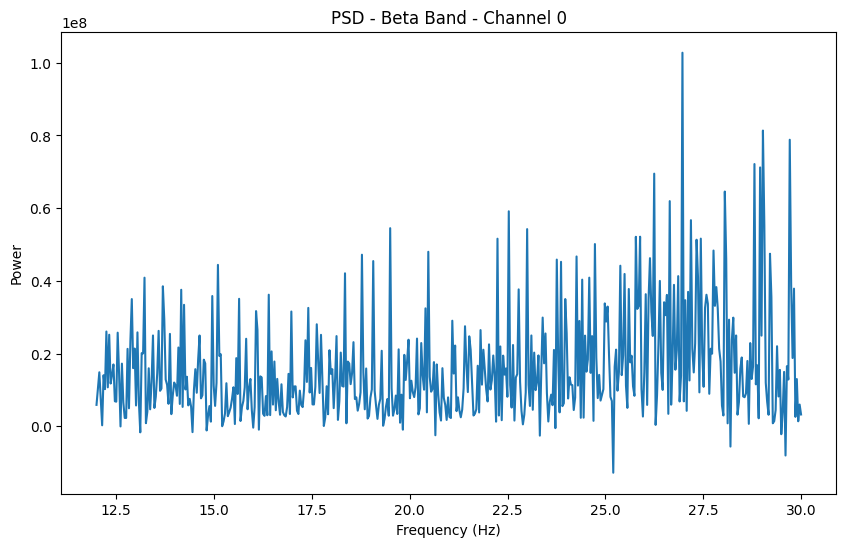

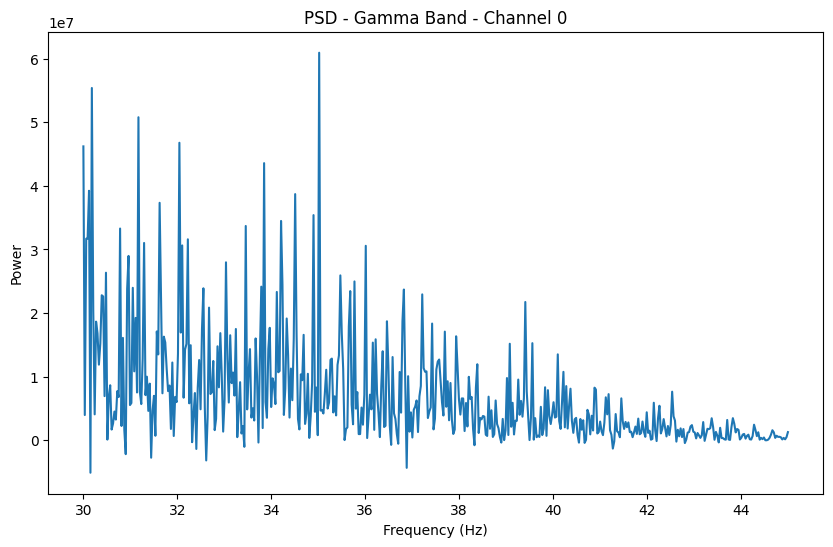

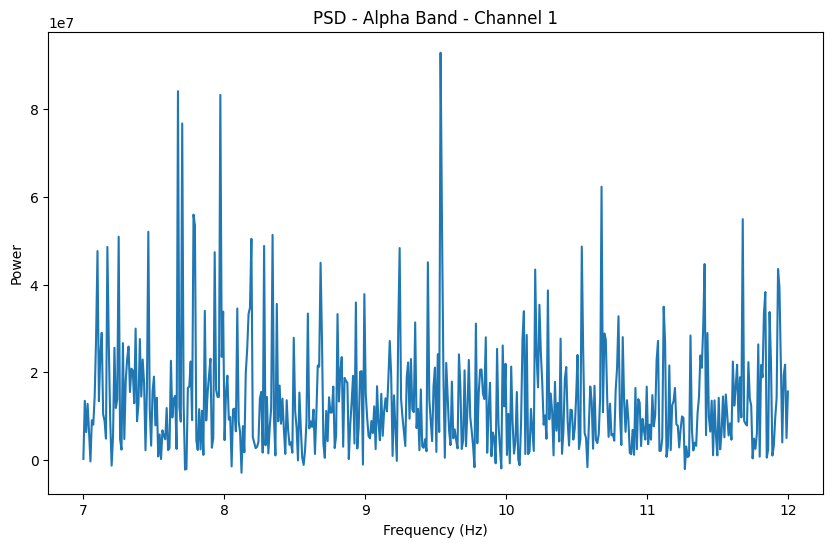

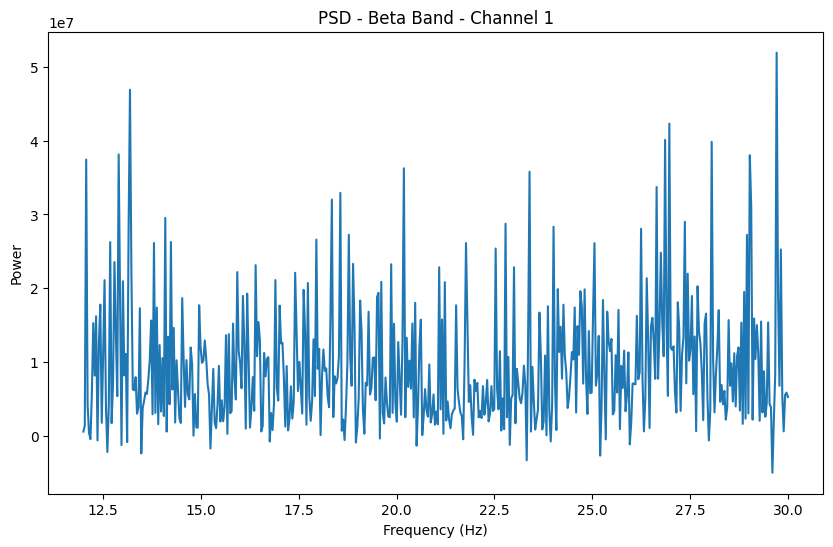

...

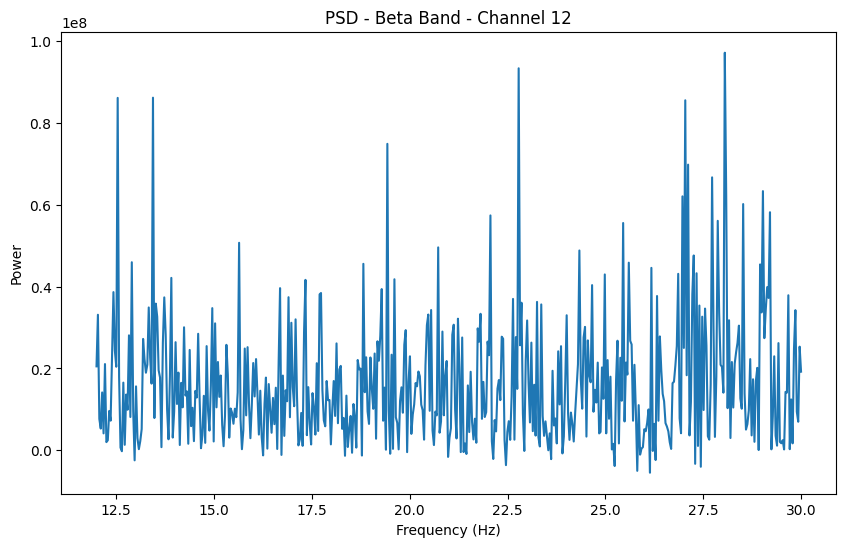

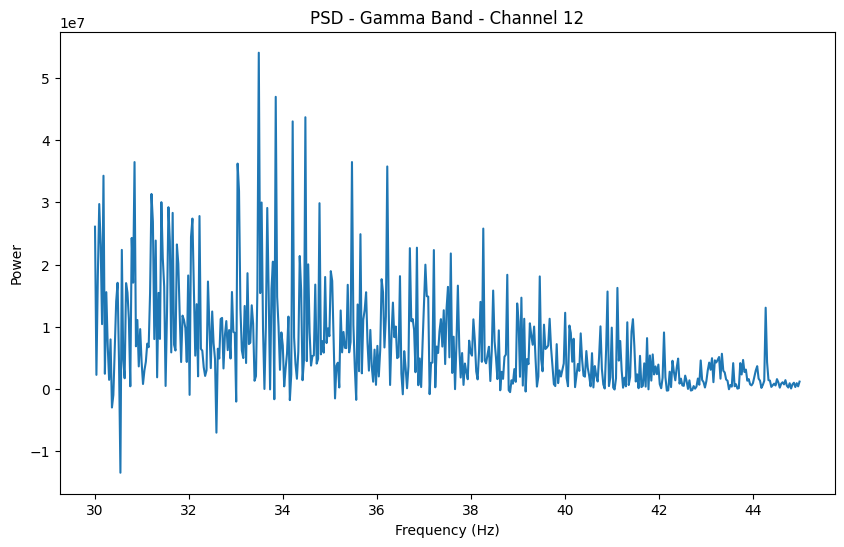

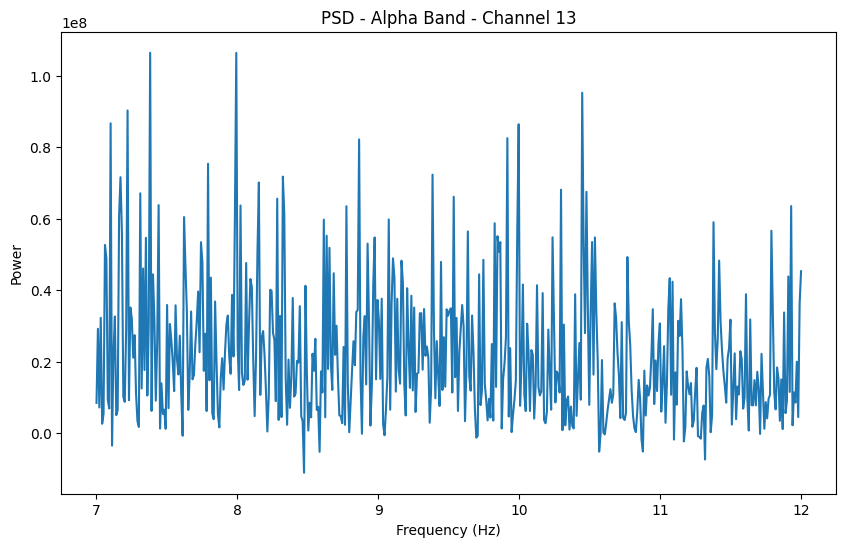

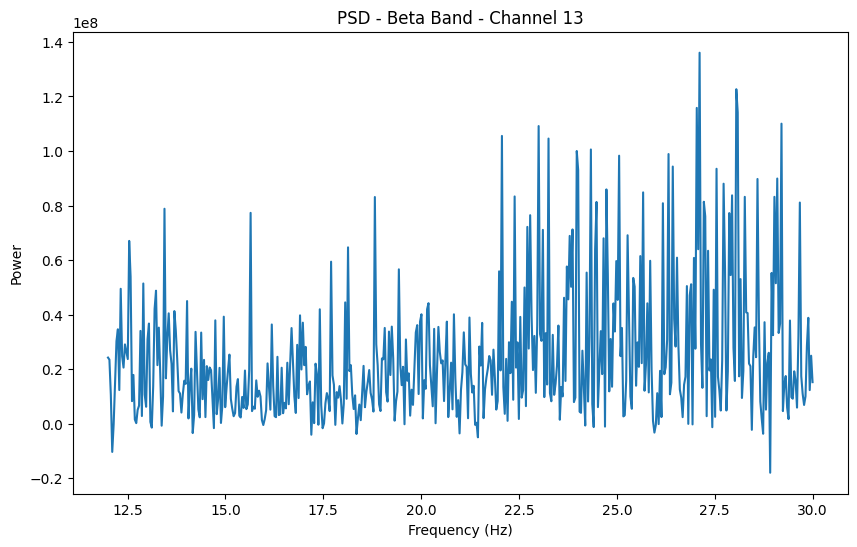

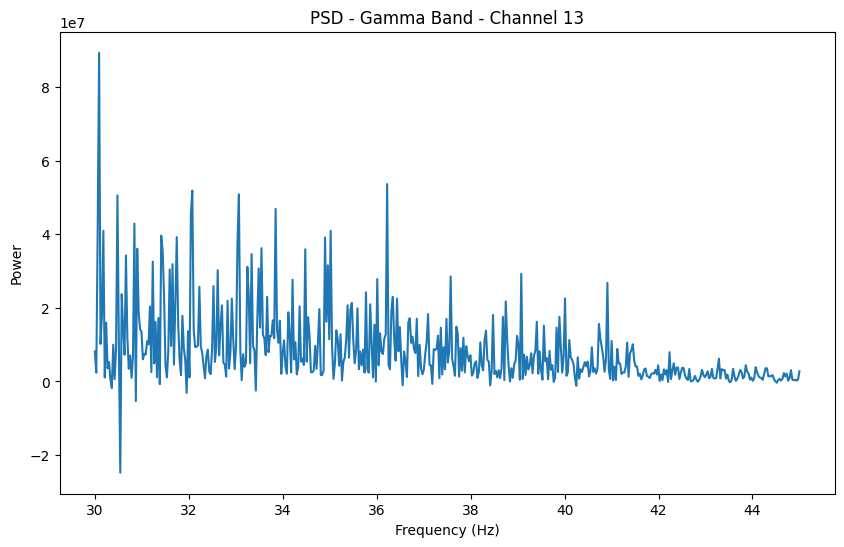

<Figure size 1000x600 with 0 Axes>

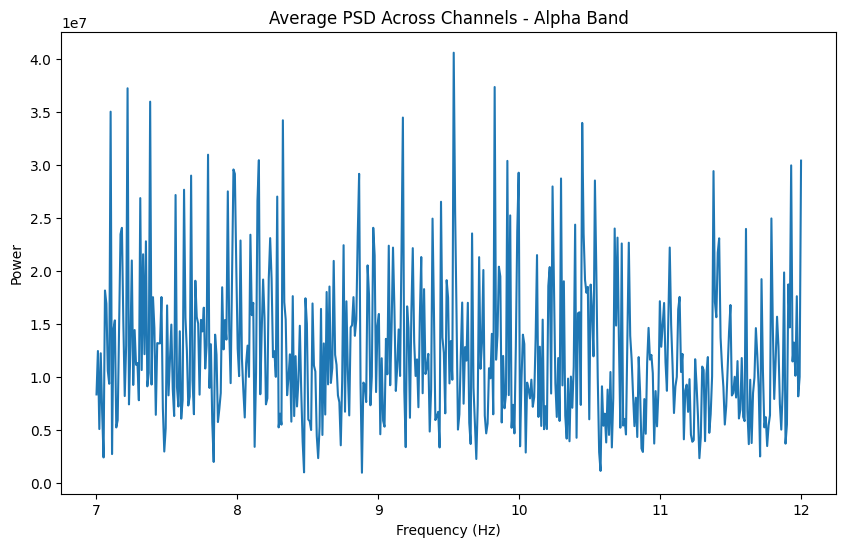

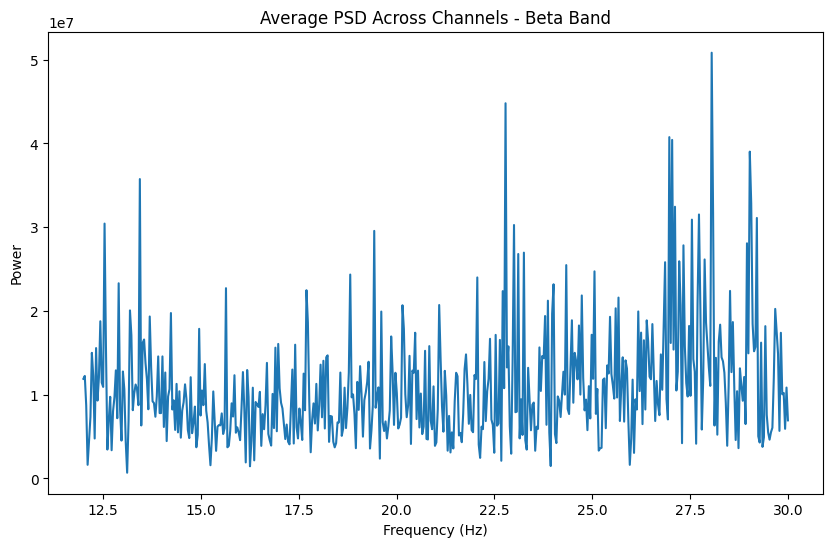

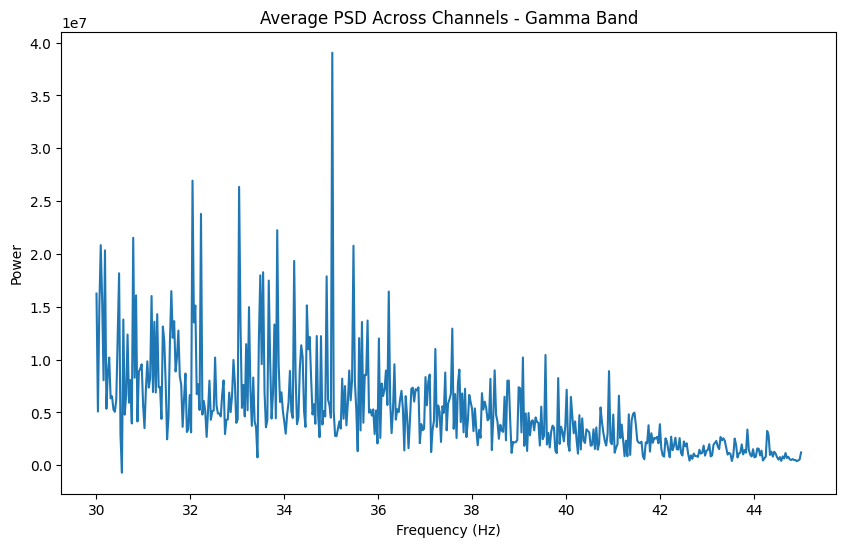

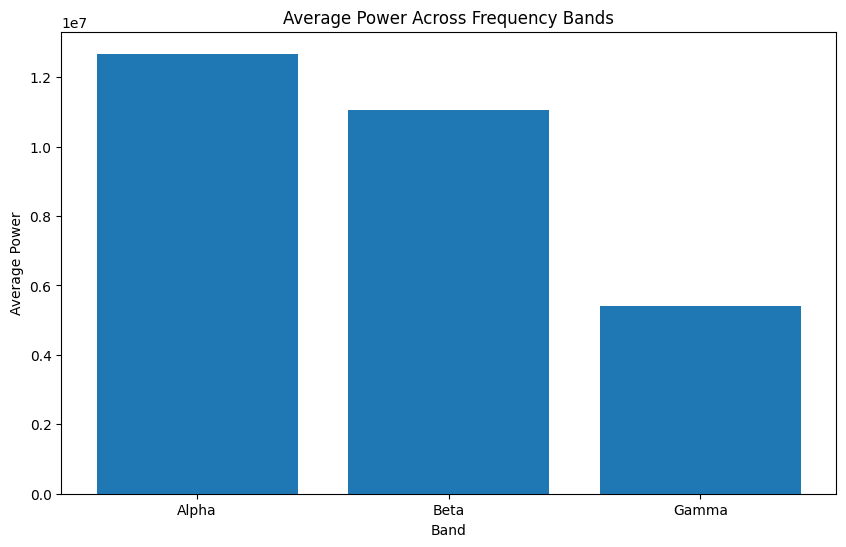

In [77]:
from scipy.interpolate import interp1d

# Function to smooth the power spectrum plot by interpolating
def smooth_plot(freqs, power, title):
    plt.figure(figsize=(10, 6))

    # Interpolating for a smoother curve
    f_interp = interp1d(freqs, power, kind='cubic', fill_value="extrapolate")

    # Generate more frequency points for smoothness
    freqs_smooth = np.linspace(min(freqs), max(freqs), num=500)
    power_smooth = f_interp(freqs_smooth)

    plt.plot(freqs_smooth, power_smooth)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.show()

# 1. Fourier Transform (FT) - Now returns frequency and power
def fourier_transform(data, sfreq, ch):
    freqs = np.fft.fftfreq(len(data[ch]), 1/sfreq)
    ft = np.fft.fft(data[ch])
    power = np.abs(ft) ** 2
    return freqs, power  # Now returning freqs and power for further use

# Band-specific PSD calculation and plotting for a single channel with smooth plot
def band_psd(data, sfreq, ch, band_ranges):
    freqs, power = fourier_transform(data, sfreq, ch)  # Now correctly receiving the values

    psd_band = {}
    for band, (low_freq, high_freq) in band_ranges.items():
        idx_band = np.where((freqs >= low_freq) & (freqs <= high_freq))
        psd_band[band] = power[idx_band]
        freqs_band = freqs[idx_band]

        # Plot PSD vs Frequency for the band
        smooth_plot(freqs_band, psd_band[band], f"PSD - {band} Band - Channel {ch}")

    return psd_band


# Plot average power across frequency bands (across channels) with smoothing
def avg_power_across_bands(data, sfreq, band_ranges):
    avg_power = []
    band_names = []

    for band, (low_freq, high_freq) in band_ranges.items():
        total_power = 0
        for ch in range(data.shape[0]):
            freqs, power = fourier_transform(data, sfreq, ch)
            idx_band = np.where((freqs >= low_freq) & (freqs <= high_freq))
            total_power += np.mean(power[idx_band])

        avg_power.append(total_power / data.shape[0])
        band_names.append(band)

    # Plot average power for each band
    plt.figure(figsize=(10, 6))
    plt.bar(band_names, avg_power)
    plt.title("Average Power Across Frequency Bands")
    plt.xlabel("Band")
    plt.ylabel("Average Power")
    plt.show()

# Calculate average PSD across all channels for each frequency band with smooth plots
def avg_psd_across_channels(data, sfreq, band_ranges):
    all_freqs = np.fft.rfftfreq(len(data[0]), 1/sfreq)
    avg_psd = {band: np.zeros_like(all_freqs) for band in band_ranges}

    for ch in range(data.shape[0]):
        freqs, power = fourier_transform(data, sfreq, ch)
        for band, (low_freq, high_freq) in band_ranges.items():
            idx_band = np.where((freqs >= low_freq) & (freqs <= high_freq))[0]
            if len(idx_band) > 0:
                avg_psd[band][idx_band] += power[idx_band]

    # Normalize by number of channels
    for band in band_ranges:
        avg_psd[band] /= data.shape[0]

    # Plot average PSD for each band with smoothing
    plt.figure(figsize=(10, 6))
    for band in band_ranges:
        idx_band = np.where((all_freqs >= band_ranges[band][0]) & (all_freqs <= band_ranges[band][1]))[0]
        smooth_plot(all_freqs[idx_band], avg_psd[band][idx_band], f"Average PSD Across Channels - {band} Band")
    plt.show()


from scipy.interpolate import interp1d
import numpy as np
import matplotlib.pyplot as plt

# Function to smooth the power spectrum plot by interpolating
def smooth_plot(freqs, power, title):
    plt.figure(figsize=(10, 6))

    # Interpolating for a smoother curve
    f_interp = interp1d(freqs, power, kind='cubic')

    # Generate more frequency points for smoothness
    freqs_smooth = np.linspace(min(freqs), max(freqs), num=500)
    power_smooth = f_interp(freqs_smooth)

    plt.plot(freqs_smooth, power_smooth)
    plt.title(title)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.show()


# Example band ranges for Alpha, Beta, and Gamma
band_ranges = {
    'Alpha': (7, 12),
    'Beta': (12, 30),
    'Gamma': (30, 45)
}

# Assuming 'raw_filtered' is your EEG data and 'sfreq' is the sampling frequency
for ch in range(14):  # Loop over 14 channels
    band_psd(data, sfreq, ch, band_ranges)  # Plot PSD for each band

# Plot average PSD across channels
avg_psd_across_channels(data, sfreq, band_ranges)

# Plot average power across frequency bands
avg_power_across_bands(data, sfreq, band_ranges)


In [79]:
import numpy as np
import pywt

# 1. Function to calculate band-specific average power from FFT
def calculate_band_power(freqs, power, band_ranges):
    band_powers = {}
    total_power = np.sum(power)

    for band, (low_freq, high_freq) in band_ranges.items():
        idx_band = np.where((freqs >= low_freq) & (freqs <= high_freq))
        band_power = np.sum(power[idx_band])
        band_powers[band] = band_power

    return band_powers, total_power

# 2. Function to extract frequency domain features (average power, power ratio, etc.)
def extract_frequency_domain_features(data, sfreq, band_ranges, ch):
    # Perform FFT to get frequency and power values
    freqs = np.fft.rfftfreq(len(data[ch]), 1/sfreq)
    fft = np.fft.rfft(data[ch])
    power = np.abs(fft) ** 2

    # Calculate band powers and total power
    band_powers, total_power = calculate_band_power(freqs, power, band_ranges)

    # Calculate power ratios (e.g., Alpha/Beta, Alpha/Gamma, etc.)
    power_ratios = {}
    for band1 in band_ranges:
        for band2 in band_ranges:
            if band1 != band2:
                power_ratios[f"{band1}/{band2}"] = band_powers[band1] / band_powers[band2]

    # Calculate relative power (band power / total power)
    relative_powers = {band: band_powers[band] / total_power for band in band_ranges}

    # Peak frequency (the frequency with maximum power)
    peak_freq = freqs[np.argmax(power)]

    # Return a dictionary of all features
    features = {
        'band_powers': band_powers,
        'power_ratios': power_ratios,
        'relative_powers': relative_powers,
        'total_power': total_power,
        'peak_frequency': peak_freq
    }

    return features

# 3. Discrete Wavelet Transform (DWT) Features
def extract_wavelet_features(data, ch, wavelet='db4'):
    coeffs = pywt.wavedec(data[ch], wavelet)

    # Calculate the energy of each wavelet level
    wavelet_energy = [np.sum(np.square(coeff)) for coeff in coeffs]

    return wavelet_energy

# Example usage for a specific channel
band_ranges = {
    'Alpha': (7, 12),
    'Beta': (12, 30),
    'Gamma': (30, 45)
}

# Assuming 'data' is your EEG data and 'sfreq' is the sampling frequency
ch = 0  # Example channel
fft_features = extract_frequency_domain_features(data, sfreq, band_ranges, ch)
wavelet_features = extract_wavelet_features(data, ch)

# Print extracted features
print("FFT Features for Channel 0:")
print(fft_features)

print("\nWavelet Features for Channel 0:")
print(wavelet_features)

# You can loop through all channels and aggregate features for statistical analysis or machine learning


FFT Features for Channel 0:
{'band_powers': {'Alpha': 21369604731.78553, 'Beta': 76176082520.6703, 'Gamma': 25609696831.919743}, 'power_ratios': {'Alpha/Beta': 0.2805290587893767, 'Alpha/Gamma': 0.8344341157975211, 'Beta/Alpha': 3.564693099230078, 'Beta/Gamma': 2.974501534345576, 'Gamma/Alpha': 1.1984169643450364, 'Gamma/Beta': 0.3361907830449351}, 'relative_powers': {'Alpha': 0.16694598904506547, 'Beta': 0.5951112150930851, 'Gamma': 0.2000709054009671}, 'total_power': 128003103602.66882, 'peak_frequency': 24.997775543163602}

Wavelet Features for Channel 0:
[246509.52397954726, 4680.806970000162, 2481.0851150107587, 1319.1461423024562, 740.4219700361307, 385.25760919580625, 832.0238800449721, 523.6601798948811, 2433.8722320624893, 319758.42317506927, 869992.2959170364, 1859216.80957148, 826776.4262235402, 23690.35747446964]
